In [41]:
import pandas as pd
import numpy as np
import sys
sys.path.append('..')

from data_center.binance_handler import BinanceHandHandler
from backtest.performance_generater import *
from backtest.factor_analysis_tool import FactorAnalysisTool
from backtest.operators import *

import alphalens
import plotly.graph_objects as go

In [54]:
Open = BinanceHandHandler().get_factor_data('open')
High = BinanceHandHandler().get_factor_data('high')
Low  = BinanceHandHandler().get_factor_data('low')
Close = BinanceHandHandler().get_factor_data('close')
Volume = BinanceHandHandler().get_factor_data('volume')
Volvalue = BinanceHandHandler().get_factor_data('volvalue')
Takerbuy = BinanceHandHandler().get_factor_data('takerbuy')
Takerbuyvalue = BinanceHandHandler().get_factor_data('takerbuyvalue')

In [55]:
for column in Open.columns.to_list():
    print(column, Open[column].dropna().index[0])

BTCUSDT 2019-09-08 00:00:00
ETHUSDT 2019-11-27 00:00:00
BNBUSDT 2020-02-10 00:00:00
AAVEUSDT 2020-10-16 00:00:00
AVAXUSDT 2020-09-23 00:00:00
ETCUSDT 2020-01-16 00:00:00
SOLUSDT 2020-09-14 00:00:00
ADAUSDT 2020-01-31 00:00:00
LINKUSDT 2020-01-17 00:00:00
BCHUSDT 2019-12-19 00:00:00
DOTUSDT 2020-08-22 00:00:00
LTCUSDT 2020-01-09 00:00:00
UNIUSDT 2020-09-18 00:00:00
XRPUSDT 2020-01-06 00:00:00
XLMUSDT 2020-01-20 00:00:00
MATICUSDT 2020-10-22 00:00:00
TRXUSDT 2020-01-15 00:00:00
DOGEUSDT 2020-07-10 00:00:00
INJUSDT 2022-08-17 00:00:00
DASHUSDT 2020-02-04 00:00:00
XEMUSDT 2021-03-03 00:00:00
ZECUSDT 2020-02-05 00:00:00


In [56]:
delete_list = [Open, High, Low, Close, Volume, Volvalue, Takerbuy, Takerbuyvalue]

for target in delete_list:
    del target['INJUSDT']
    del target['XEMUSDT']
    target.dropna(inplace=True)

returns = Close.pct_change()
expreturn = Close.pct_change().shift(-2)
Benchmark = expreturn['BTCUSDT']

### Sharpe Factor

### pleatu

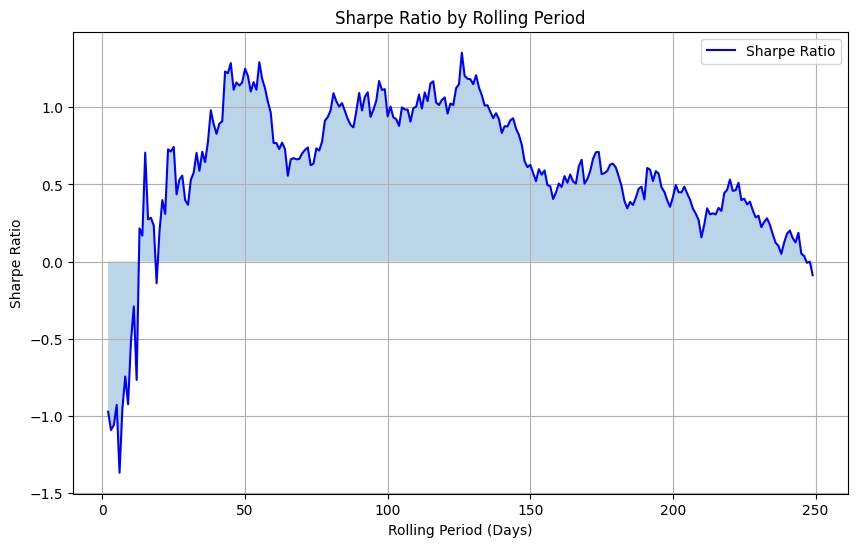

In [80]:
periods = []
sharpes = []

for period in range(2,250,1):
    rolling_returns = returns.rolling(window = period).mean()
    rolling_std_dev = returns.rolling(window = period).std()
    sharpe_factor = rolling_returns / rolling_std_dev
    sharpe_factor = sharpe_factor.dropna()
    returns_by_period = PerformanceGenerator(factor = sharpe_factor, 
                                                expreturn = expreturn,
                                                strategy = 'LS',
                                                buy_fee = 0.04/100,
                                                sell_fee = 0.04/100,
                                                start_time = '2023-01-01',
                                                end_time = '2024-01-19',#'2024-03-19',
                                                period_of_year = 365,
                                                benchmark = Benchmark).get_returns_by_period()
    sharpe = get_sharpe(returns_by_period, 365)
    periods.append(period)
    sharpes.append(sharpe)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(periods, sharpes, label='Sharpe Ratio', color='blue')
plt.fill_between(periods, sharpes, alpha=0.3)
plt.title('Sharpe Ratio by Rolling Period')
plt.xlabel('Rolling Period (Days)')
plt.ylabel('Sharpe Ratio')
plt.legend()
plt.grid(True)
plt.show()


In [81]:
period = 30
rolling_returns = returns.rolling(window = period).mean()
rolling_std_dev = returns.rolling(window = period).std()
sharpe_factor = rolling_returns / rolling_std_dev
sharpe_factor = sharpe_factor.dropna()
returns_by_period, _ = PerformanceGenerator(factor = sharpe_factor, 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |       152.87 %        |       108.69 %       |     0.88     |    21.22 %     |   30.29 %    |  25.66 %   | 1.62 % | 26.07 %  |
|  Benchmark  |       255.51 %        |       197.39 %       |     0.76     |    30.09 %     |   76.67 %    |  54.11 %   | 3.41 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [45]:
weighting = PerformanceGenerator(factor = sharpe_factor, 
                            expreturn = expreturn,
                            strategy = 'LS',
                            buy_fee = 0.04/100,
                            sell_fee = 0.04/100,
                            start_time = '2020-01-01',
                            end_time = '2024-03-19',
                            period_of_year = 365,
                            benchmark = Benchmark
                            ).get_weighting_by_period()
weighting.iloc[-30:]

,BTCUSDT,ETHUSDT,BNBUSDT,AAVEUSDT,AVAXUSDT,ETCUSDT,SOLUSDT,ADAUSDT,LINKUSDT,BCHUSDT,DOTUSDT,LTCUSDT,UNIUSDT,XRPUSDT,XLMUSDT,MATICUSDT,TRXUSDT,DOGEUSDT,DASHUSDT,ZECUSDT
datetime,,,,,,,,,,,,,,,,,,,,
2024-02-23,0.079311,0.098576,0.058641,-0.051387,-0.057387,-0.040587,-0.066380,-0.006367,0.013372,-0.015362,-0.011208,-0.054155,0.030959,-0.059581,-0.071709,0.023738,0.195403,-0.032668,-0.026107,-0.007103
2024-02-24,0.094484,0.097869,0.063401,-0.042188,-0.071021,-0.070646,-0.076477,-0.003109,-0.008845,-0.027813,0.008872,-0.052549,0.006317,-0.032929,-0.058860,0.015580,0.213478,-0.030706,-0.013226,-0.011632
2024-02-25,0.083649,0.127841,0.075171,-0.003611,-0.057388,-0.035622,-0.075402,-0.010755,-0.027052,-0.044073,0.020826,-0.068679,-0.013425,-0.045919,-0.050282,0.001681,0.184352,-0.044385,0.006479,-0.023408
2024-02-26,0.080963,0.122079,0.085566,0.024378,-0.052900,-0.031650,-0.056583,-0.008102,-0.062545,-0.044008,0.013104,-0.064347,-0.029944,-0.044525,-0.044085,0.002145,0.171765,-0.034002,-0.000945,-0.026362
2024-02-27,0.096497,0.131516,0.059752,0.018593,-0.087267,-0.042808,-0.080054,-0.013854,-0.083766,-0.020324,0.014026,-0.051021,-0.031285,-0.021019,-0.020687,-0.009245,0.179615,-0.004605,-0.007119,-0.026946
2024-02-28,0.094381,0.148701,0.077834,0.011757,-0.065674,-0.014155,-0.034505,-0.012062,-0.069533,-0.027416,0.021336,-0.057221,-0.033158,-0.050863,-0.046364,-0.014312,0.137153,0.008838,-0.038549,-0.036188
2024-02-29,0.092339,0.157664,0.028588,0.049005,-0.066649,-0.055748,-0.016852,0.030011,-0.122184,-0.029171,0.032881,-0.015687,-0.047613,-0.028249,-0.041376,-0.026126,0.102038,0.006387,0.001088,-0.050347
2024-03-01,0.087522,0.159161,0.035740,0.046715,-0.059087,-0.021533,-0.022400,0.035300,-0.151417,-0.023184,0.032268,-0.013399,-0.061667,-0.034688,-0.022055,-0.038770,0.090662,0.012631,-0.003571,-0.048227
2024-03-02,0.072674,0.139810,0.030072,0.069588,-0.054593,-0.028552,-0.048897,0.040690,-0.114422,-0.079552,0.034191,-0.011150,-0.083805,-0.017644,-0.011430,-0.049956,0.059760,0.006244,0.004816,0.042157


In [85]:
FactorAnalysisTool(factor = sharpe_factor, 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).quantile_analysis(5)

Quantile 5 represents the highest factor value


/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to n

Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-0.497876,0.381235,-0.090266,0.152618,4836,20.000827
2,-0.420539,0.451560,-0.020492,0.151149,4836,20.000827
3,-0.334860,0.478483,0.025314,0.153399,4835,19.996691
4,-0.293996,0.536525,0.079543,0.160134,4836,20.000827
5,-0.276221,0.750693,0.181745,0.176441,4836,20.000827


Returns Analysis


,1D,5D,10D
Ann. alpha,0.304,0.248,0.184
beta,0.013,0.008,0.006
Mean Period Wise Return Top Quantile (bps),16.564,14.588,10.043
Mean Period Wise Return Bottom Quantile (bps),-12.427,-9.717,-9.099
Mean Period Wise Spread (bps),28.991,23.006,17.870


<Figure size 640x480 with 0 Axes>

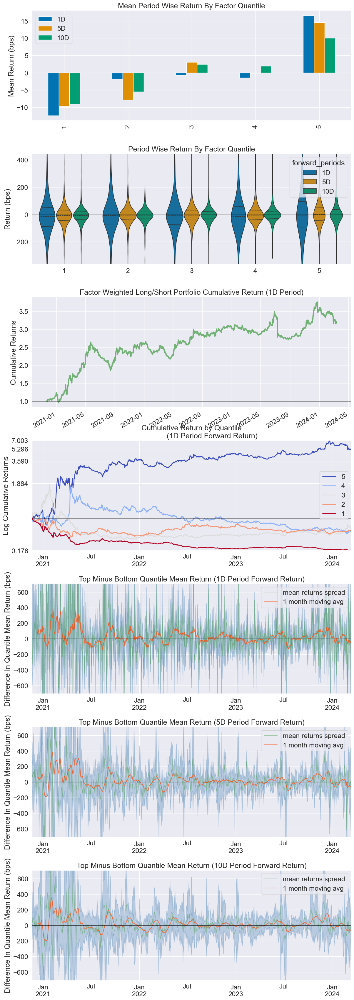

Information Analysis


,1D,5D,10D
IC Mean,-0.012,0.001,0.004
IC Std.,0.277,0.279,0.280
Risk-Adjusted IC,-0.042,0.003,0.015
t-stat(IC),-1.451,0.100,0.539
p-value(IC),0.147,0.920,0.590
IC Skew,0.025,0.008,0.042
IC Kurtosis,-0.403,-0.385,-0.482


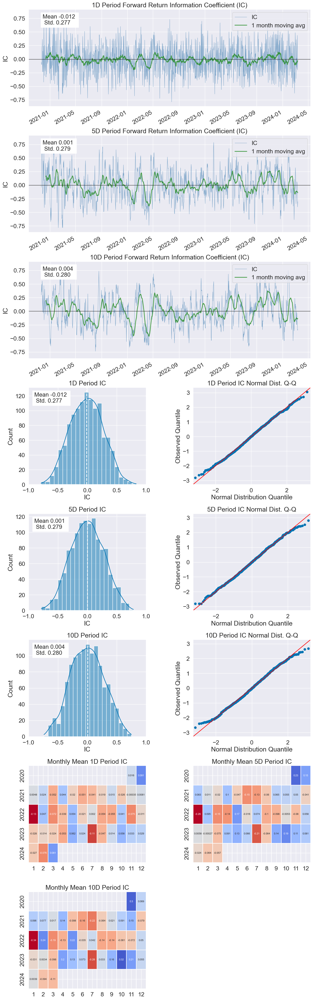

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:929: UserWarning:

Skipping return periods that aren't exact multiples of days.



Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.188,0.384,0.512
Quantile 2 Mean Turnover,0.376,0.600,0.699
Quantile 3 Mean Turnover,0.402,0.632,0.730
Quantile 4 Mean Turnover,0.341,0.583,0.686
Quantile 5 Mean Turnover,0.150,0.315,0.437


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.937,0.771,0.598


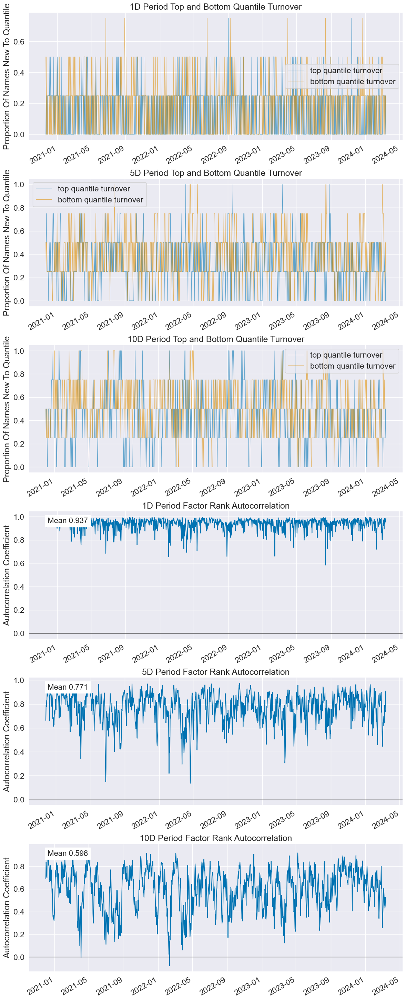

In [84]:
factor = sharpe_factor.dropna()
factor = factor.unstack().swaplevel(i=0, j=1)

factor_daily = factor.sort_index()

close_daily = Close.shift(-1)

# Ingest and format data
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor_daily,
                                                                   close_daily,
                                                                   quantiles=5)

# Run analysis
alphalens.tears.create_full_tear_sheet(factor_data)

### Momentum Factor

In [ ]:
MF = ts_pct_change(Close, 7)
returns_by_period, _ = PerformanceGenerator(factor = MF, 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        22.16 %        |       26.47 %        |     0.58     |    13.40 %     |   20.49 %    |  28.66 %   | 1.50 % | 52.07 %  |
|  Benchmark  |       182.68 %        |       124.04 %       |     1.55     |    92.10 %     |   29.54 %    |  50.25 %   | 2.63 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [ ]:
Close_WD = Close.resample('W-FRI').last()
factor = Close_WD.pct_change().resample('D').ffill()
factor = (factor - factor.median(axis =1).values[:,None]).abs()
returns_by_period, _ = PerformanceGenerator(factor = factor , 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        78.65 %        |       63.45 %        |     1.52     |    44.17 %     |   14.40 %    |  26.25 %   | 1.37 % | 17.07 %  |
|  Benchmark  |       210.21 %        |       132.76 %       |     1.69     |    104.14 %    |   29.54 %    |  49.64 %   | 2.60 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [ ]:
rrr, _ = PerformanceGenerator(factor = factor , 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = df['eq']
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        78.65 %        |       63.45 %        |     1.52     |    44.17 %     |   14.40 %    |  26.25 %   | 1.37 % | 17.07 %  |
|  Benchmark  |        91.47 %        |       94.04 %        |     0.98     |    50.60 %     |   34.09 %    |  60.35 %   | 3.16 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [ ]:
weighting*expreturn['2023-12':'2024-01'].cumsum().iplot()

TypeError: unsupported operand type(s) for *: 'float' and 'NoneType'

In [ ]:
split_date = ['W-MON', 'W-TUE', 'W-WED', 'W-THU', 'W-FRI', 'W-SAT', 'W-SUN']
for date in split_date:
    print(date)
    Close_WD = Close.resample(date).last()
    MF = Close_WD.pct_change()
    expreturn_WD = Close_WD.pct_change().shift(-2)
    returns_by_period, _ = PerformanceGenerator(factor = MF, 
                                                expreturn = expreturn_WD,
                                                strategy = 'LS',
                                                buy_fee = 0.04/100,
                                                sell_fee = 0.04/100,
                                                start_time = '2020-01-01',
                                                end_time = '2024-03-19',
                                                period_of_year = 52,
                                                #benchmark = Benchmark
                                                ).backtest()

W-MON
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        6.14 %         |        9.34 %        |    0.28 %    |     3.81 %     |   20.41 %    |  20.84 %   | 2.89 % | 138.58 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-TUE
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        47.36 %        |       41.45 %        |    1.42 %    |    27.49 %     |   13.70 %    |  18.24 %   | 2.53 % | 137.46 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-WED
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        3.63 %         |        7.27 %        |    0.21 %    |     2.26 %     |   25.49 %    |  21.70 %   | 3.01 % | 139.10 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-THU
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        46.83 %        |       42.97 %        |    1.11 %    |    27.21 %     |   12.42 %    |  24.18 %   | 3.35 % | 139.64 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-FRI
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        58.64 %        |       50.36 %        |    1.37 %    |    33.52 %     |   13.76 %    |  23.02 %   | 3.19 % | 138.39 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-SAT
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        31.33 %        |       31.87 %        |    0.83 %    |    18.62 %     |   18.87 %    |  23.99 %   | 3.33 % | 136.91 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-SUN
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        -3.73 %        |        0.54 %        |    0.01 %    |    -2.35 %     |   21.75 %    |  23.46 %   | 3.25 % | 138.70 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


Dropped 3.9% entries from factor data: 3.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to n

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,0.000036,0.037356,0.005436,0.005231,2830,22.727273
2,0.004056,0.073993,0.016615,0.010500,2264,18.181818
3,0.008081,0.085728,0.028631,0.014331,2264,18.181818
4,0.014704,0.134392,0.046677,0.020650,2264,18.181818
5,0.024592,0.629366,0.114707,0.096100,2830,22.727273


Returns Analysis


,1D,5D,10D
Ann. alpha,0.279,0.261,0.226
beta,0.096,0.140,0.145
Mean Period Wise Return Top Quantile (bps),8.244,6.620,6.291
Mean Period Wise Return Bottom Quantile (bps),-11.664,-10.709,-8.494
Mean Period Wise Spread (bps),19.908,17.045,14.573


<Figure size 640x480 with 0 Axes>

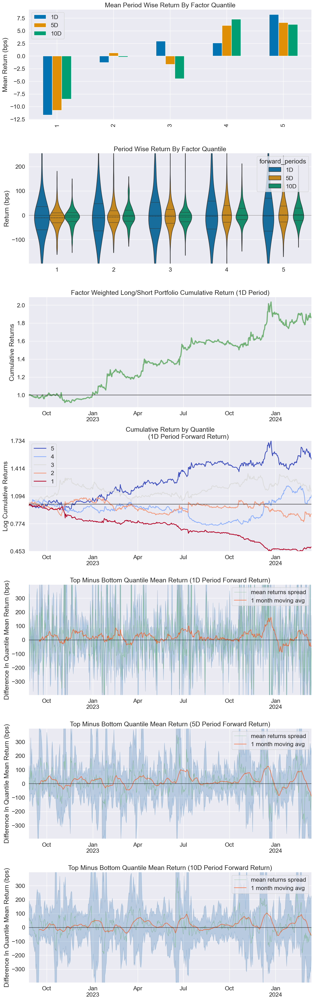

Information Analysis


,1D,5D,10D
IC Mean,-0.010,0.025,0.035
IC Std.,0.235,0.240,0.258
Risk-Adjusted IC,-0.040,0.103,0.136
t-stat(IC),-0.962,2.439,3.247
p-value(IC),0.336,0.015,0.001
IC Skew,-0.038,0.015,0.200
IC Kurtosis,-0.201,-0.219,-0.298


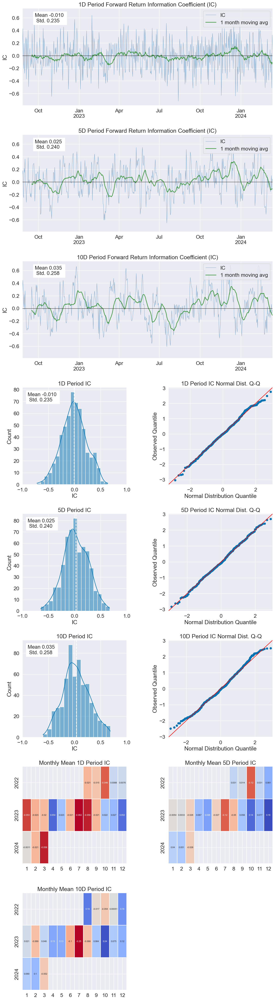

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:929: UserWarning:

Skipping return periods that aren't exact multiples of days.



Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.107,0.538,0.746
Quantile 2 Mean Turnover,0.112,0.566,0.817
Quantile 3 Mean Turnover,0.114,0.575,0.805
Quantile 4 Mean Turnover,0.114,0.575,0.804
Quantile 5 Mean Turnover,0.095,0.476,0.666


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.88,0.395,0.143


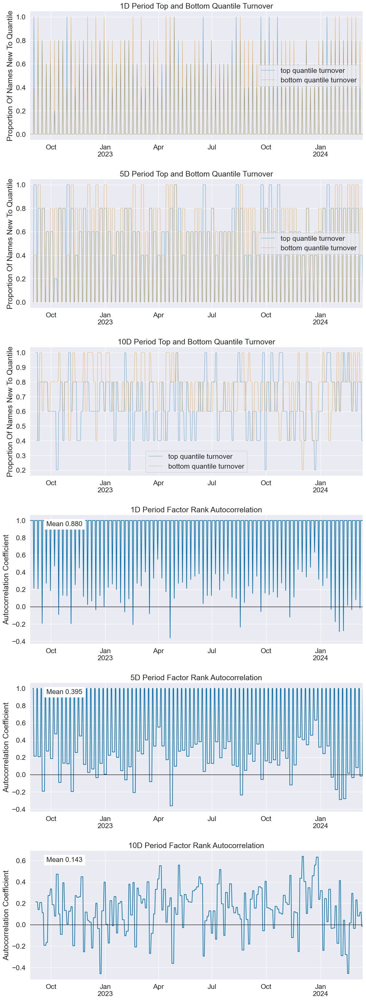

In [ ]:
import alphalens

Close_WD = Close.resample('W-FRI').last()

# 把假日資料變不見做因子看看

factor = Close_WD.pct_change().resample('D').ffill()
factor = (factor - factor.median(axis =1).values[:,None]).abs()
factor = factor.unstack().swaplevel(i=0, j=1)

factor_daily = factor.sort_index()

close_daily = Close.shift(-1)

# Ingest and format data
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor_daily,
                                                                   close_daily,
                                                                   quantiles=5)

# Run analysis
alphalens.tears.create_full_tear_sheet(factor_data)

/Users/tedting/Documents/FactorTradingSystem/test/../backtest/performance_generater.py:100: RuntimeWarning:

invalid value encountered in scalar divide



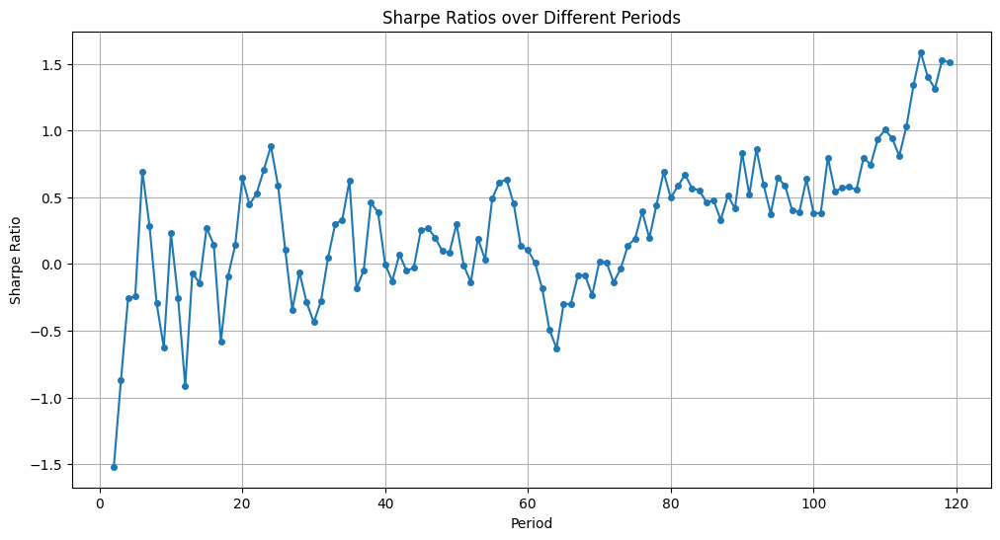

In [ ]:
sharpes = []
periods = []

period_range = range(1, 120, 1)

# Iterate over all combinations of period_1 and period_2 using itertools.product
for period in period_range:
    LogRet= np.log(Close/Close.shift(1))
    R_F = LogRet.rolling(window=period).sum().dropna()
    alpha_2 = ts_rank(R_F, period)
    returns_by_period = PerformanceGenerator(alpha_2,
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                             ).get_returns_by_period()
    sharpe = PerformanceGenerator(alpha_2,
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                             ).get_sharpe(returns_by_period)

    sharpes.append(sharpe)
    periods.append(period)

import matplotlib.pyplot as plt

# Plot Sharpe Ratios over periods
plt.figure(figsize=(12, 6))
plt.plot(periods, sharpes, marker='o', linestyle='-', markersize=4)
plt.xlabel('Period')
plt.ylabel('Sharpe Ratio')
plt.title('Sharpe Ratios over Different Periods')
plt.grid(True)
plt.show()

In [ ]:
LogRet= np.log(Close/Close.shift(1))
R_F = LogRet.rolling(window=50).sum().dropna()
R_F
returns_by_period, _ = PerformanceGenerator(factor = R_F, 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        63.39 %        |       53.30 %        |     1.52     |    40.14 %     |   19.44 %    |  24.06 %   | 1.26 % | 18.13 %  |
|  Benchmark  |       235.74 %        |       138.49 %       |     1.95     |    129.91 %    |   25.91 %    |  48.82 %   | 2.56 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [ ]:
period = 125
rolling_returns = returns.rolling(window = period).mean()
rolling_std_dev = returns.rolling(window = period).std()
sharpe_factor = rolling_returns / rolling_std_dev

Close_WD = Close.resample('W-FRI').last()
fri_returns_factor = Close_WD.pct_change().resample('D').ffill()

LogRet= np.log(Close/Close.shift(1))
R_F = LogRet.rolling(window=50).sum().dropna()

Multi_alpha = sharpe_factor + fri_returns_factor + R_F
returns_by_period, _ = PerformanceGenerator(factor = Multi_alpha, 
                                            expreturn = expreturn,
                                            strategy = 'LO',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |       533.04 %        |       220.12 %       |     2.06     |    218.77 %    |   34.38 %    |  67.17 %   | 3.52 % | 11.94 %  |
|  Benchmark  |       182.68 %        |       124.04 %       |     1.55     |    92.10 %     |   29.54 %    |  50.25 %   | 2.63 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


Dropped 23.9% entries from factor data: 23.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to n

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.283865,0.520520,-0.145557,0.249293,2250,22.727273
2,-0.698444,0.711121,-0.010106,0.239051,1800,18.181818
3,-0.491337,0.858677,0.076464,0.251442,1800,18.181818
4,-0.408436,1.013204,0.184502,0.269880,1800,18.181818
5,-0.275780,1.949576,0.502198,0.436831,2250,22.727273


Returns Analysis


,1D,5D,10D
Ann. alpha,0.314,0.268,0.247
beta,0.105,0.137,0.102
Mean Period Wise Return Top Quantile (bps),15.517,12.665,10.456
Mean Period Wise Return Bottom Quantile (bps),-8.842,-12.616,-13.815
Mean Period Wise Spread (bps),24.358,24.575,23.542


<Figure size 640x480 with 0 Axes>

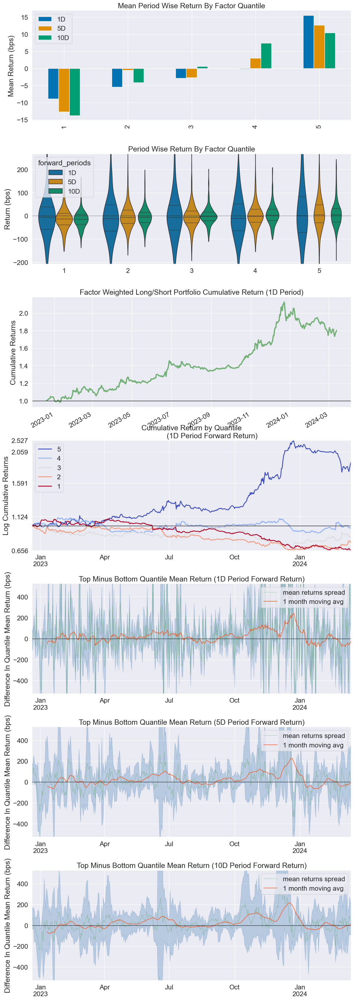

Information Analysis


,1D,5D,10D
IC Mean,-0.006,0.029,0.063
IC Std.,0.285,0.293,0.300
Risk-Adjusted IC,-0.022,0.097,0.209
t-stat(IC),-0.462,2.064,4.426
p-value(IC),0.644,0.040,0.000
IC Skew,0.114,-0.018,-0.166
IC Kurtosis,-0.499,-0.569,-0.689


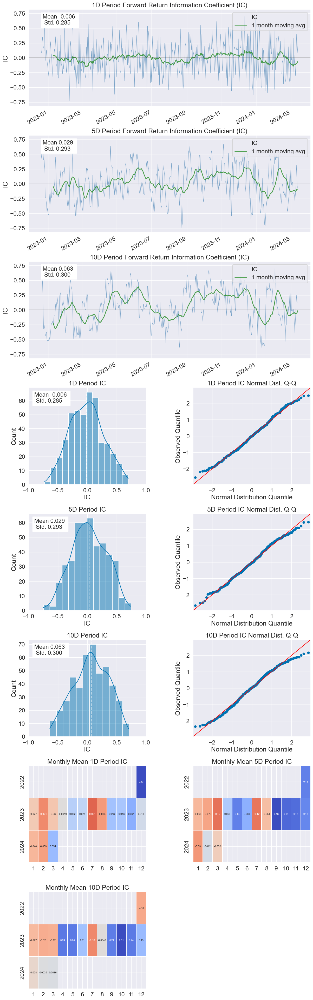

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:929: UserWarning:

Skipping return periods that aren't exact multiples of days.



Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.115,0.261,0.354
Quantile 2 Mean Turnover,0.303,0.544,0.649
Quantile 3 Mean Turnover,0.325,0.597,0.690
Quantile 4 Mean Turnover,0.256,0.533,0.648
Quantile 5 Mean Turnover,0.086,0.236,0.347


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.963,0.843,0.732


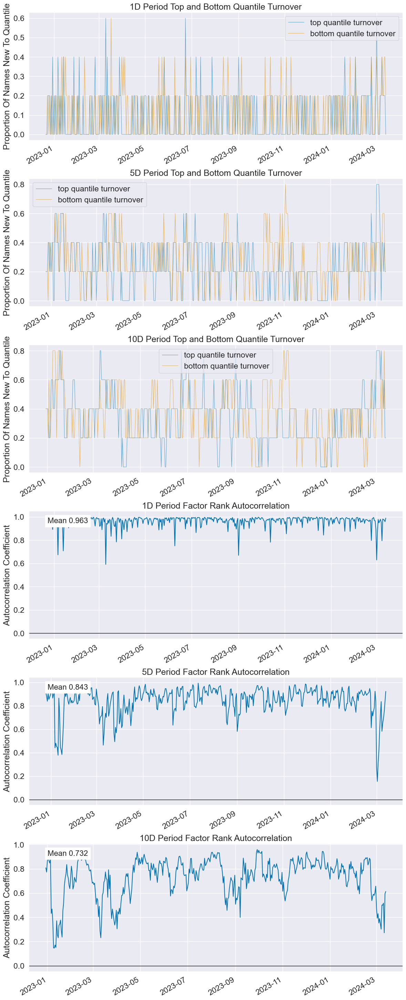

In [ ]:
factor = Multi_alpha.unstack().swaplevel(i=0, j=1)

factor_daily = factor.sort_index()

close_daily = Close.shift(-1)

# Ingest and format data
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor_daily,
                                                                   close_daily,
                                                                   quantiles=5)

# Run analysis
alphalens.tears.create_full_tear_sheet(factor_data)

In [ ]:
cufflinks.go_offline()

In [ ]:
import cufflinks
cufflinks.go_offline()
df = returns
df['eq'] = returns.mean(axis =1)

In [ ]:
df['factor'] = returns_by_period

In [ ]:
(returns_by_period - df['eq']/2).cumsum().iplot()

In [ ]:
df.loc['2022-12-23':].cumsum().iplot()

In [ ]:
df.std()

BTCUSDT      0.026261
ETHUSDT      0.030931
BNBUSDT      0.028950
AAVEUSDT     0.042521
AVAXUSDT     0.045632
ETCUSDT      0.041614
SOLUSDT      0.058857
ADAUSDT      0.037514
LINKUSDT     0.041634
BCHUSDT      0.048225
DOTUSDT      0.035996
LTCUSDT      0.037825
UNIUSDT      0.046456
XRPUSDT      0.047193
XLMUSDT      0.041308
MATICUSDT    0.044470
TRXUSDT      0.022147
DOGEUSDT     0.046397
INJUSDT      0.061456
DASHUSDT     0.038647
XEMUSDT      0.043315
ZECUSDT      0.038248
eq           0.031789
factor       0.035158
dtype: float64

TypeError: Axes.hist() missing 1 required positional argument: 'x'

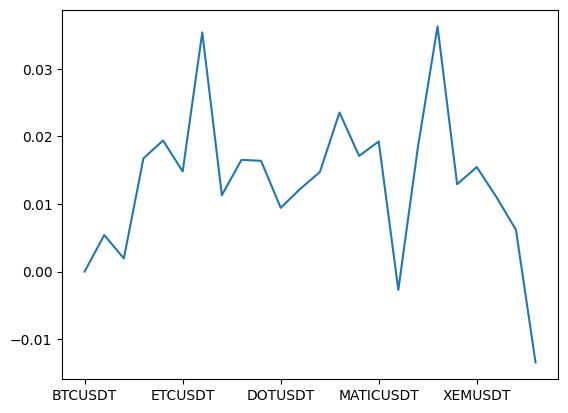

In [ ]:
BTC_std = df.loc[:'2023'].std()['BTCUSDT']
(df.loc[:'2023'].std() - BTC_std).plot().hist()

In [ ]:
# 假設 df 是你的 DataFrame，並且包含到2023年的數據
BTC_std = df.loc[:'2023'].std()['BTCUSDT']

# 計算每個資產相對於BTC的標準差差異
std_diff = df.loc[:'2023'].std() - BTC_std

# 繪製這些標準差差異的直方圖
std_diff.iplot(kind= 'bar')


In [ ]:
# 假設 df 是你的 DataFrame，並且包含到2023年的數據
BTC_std = df.loc['2024':].std()['BTCUSDT']

# 計算每個資產相對於BTC的標準差差異
std_diff = df.loc['2024':].std() - BTC_std

# 繪製這些標準差差異的直方圖
std_diff.iplot(kind= 'bar')